In [1]:
# import itertools
import os
import sys
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io

from collections import defaultdict
from tqdm.auto import tqdm
from joblib import Parallel, delayed
import re
import h5py
import napari
import tifffile as tiff
import seaborn as sns
import pickle
import matplotlib

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
p_dir = (Path().cwd().parents[0]).absolute()

module_path = str(p_dir / "src")
 
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
data_dir = (Path().cwd().parents[0] / 'data').absolute()
fig_dir = (Path().cwd().parents[0] / 'figures').absolute()

df_meta_path = data_dir /'tissue'  / 'metadata' / 'imgs_reg.csv'
df_imgs = pd.read_csv(df_meta_path)


In [5]:
df_imgs = df_imgs[df_imgs.FOV == '40X']

In [6]:
df_imgs

,Condition,FOV,Path
1,577-1197,40X,y:\coskun-lab\Thomas\23_PLA_revision\data\tiss...
3,577-1210,40X,y:\coskun-lab\Thomas\23_PLA_revision\data\tiss...


# Read adata

In [7]:
import scanpy as sc

# Read adata and HE prediction dataframe
path = data_dir / 'tissue' / 'metadata' / 'cells.h5ad'
adata = sc.read_h5ad(path)
df_obs = adata.obs.copy()

df_HE = pd.read_csv( data_dir / 'tissue' / 'metadata' / 'HE_cell_type.csv', index_col=0)
df_HE = df_HE.drop_duplicates(subset=['Condition', 'Cell_ID'], keep='first')

# Get number of type prediction
type_dict = {0: "Tumor",
    1: 'Immune',
    2: 'Stroma',
    3: 'Other',
    4: "Epithelial"}
df_HE['Prediction'] = df_HE['type'].apply(lambda x: type_dict.get(x, x))

# merge dataframe and fill NA
df_all = df_obs.merge(df_HE, left_on=['Condition', 'Cell'], right_on=['Condition', 'Cell_ID'], how='left')
df_all['Prediction'] = df_all['Prediction'].fillna('Other')

df_all['Cell Type'] = df_all['Cell Type'].astype(str)

c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\pandas\core\arrays\categorical.py:555: RuntimeWarning: invalid value encountered in cast
  np.array(self.categories._na_value).astype(dtype)


c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\anndata\_core\anndata.py:788: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


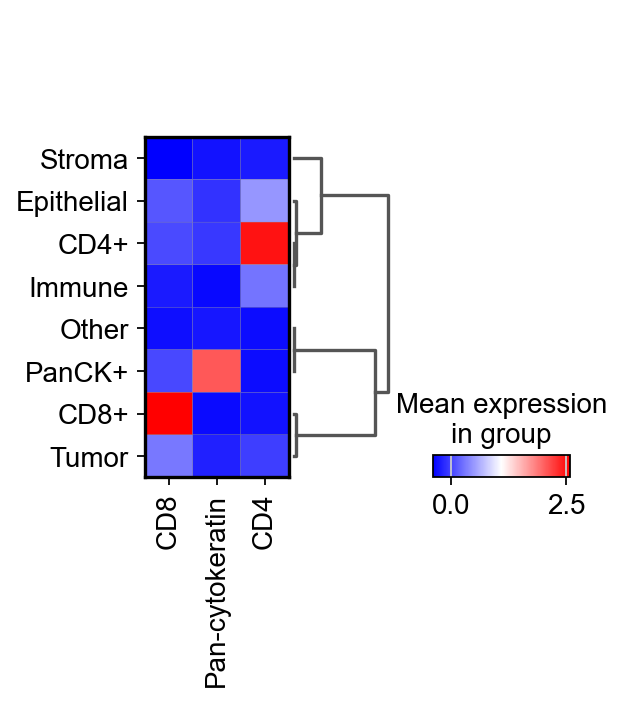

In [8]:
# Change cell type 
df_all.loc[df_all['Cell Type'] == 'Other', 'Cell Type'] = df_all.loc[df_all['Cell Type'] == 'Other']['Prediction']
df_all['Cell Type'] = df_all['Cell Type'].astype('category')

# Assign to cell type
adata.obs = df_all

sc.set_figure_params( fontsize=15)

sc.tl.dendrogram(adata, groupby='Cell Type')
sc.pl.matrixplot(adata, adata.var_names, groupby='Cell Type', 
                 dendrogram=True, cmap='bwr')

c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:368: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


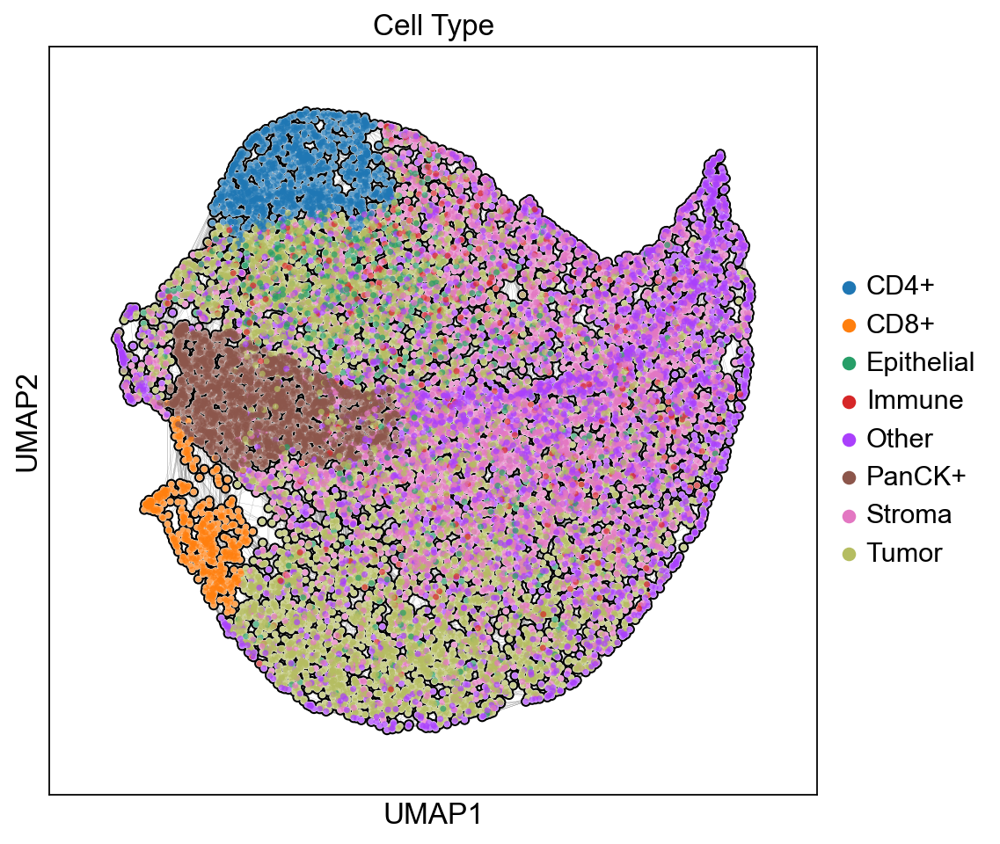

In [9]:
fig, ax = plt.subplots(figsize=(7,7))
sc.pl.umap(adata, color='Cell Type', ax=ax, size=40, edges=True, add_outline=True)

In [10]:
map_dict = {'PanCK+': 'Tumor', 'Stroma': 'Stroma', 'CD4+':'Immune', 'Epithelial':'Tumor', 'CD8+':'Immune'}

adata.obs['Cell Type 2'] = adata.obs['Cell Type'].apply(lambda x: map_dict.get(x,x))
adata.obs['Cell Type 2'] = adata.obs['Cell Type 2'].astype('category')

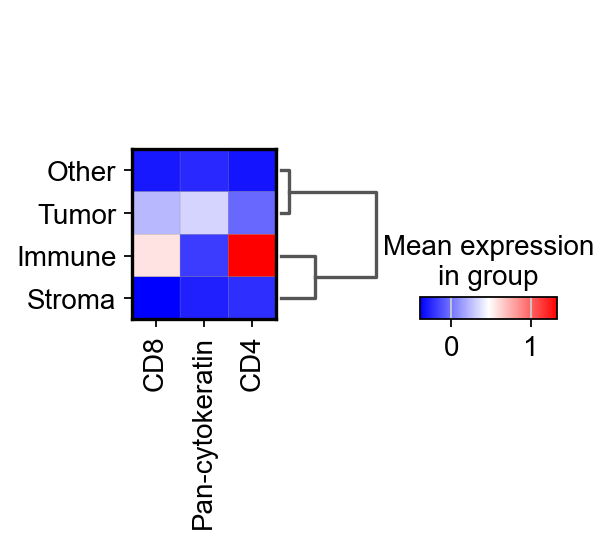

In [11]:
sc.set_figure_params( fontsize=15)

sc.tl.dendrogram(adata, groupby='Cell Type 2')
sc.pl.matrixplot(adata, adata.var_names, groupby='Cell Type 2', 
                 dendrogram=True, cmap='bwr')

c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:368: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
c:\Users\thu71\AppData\Local\anaconda3\envs\scanpy\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


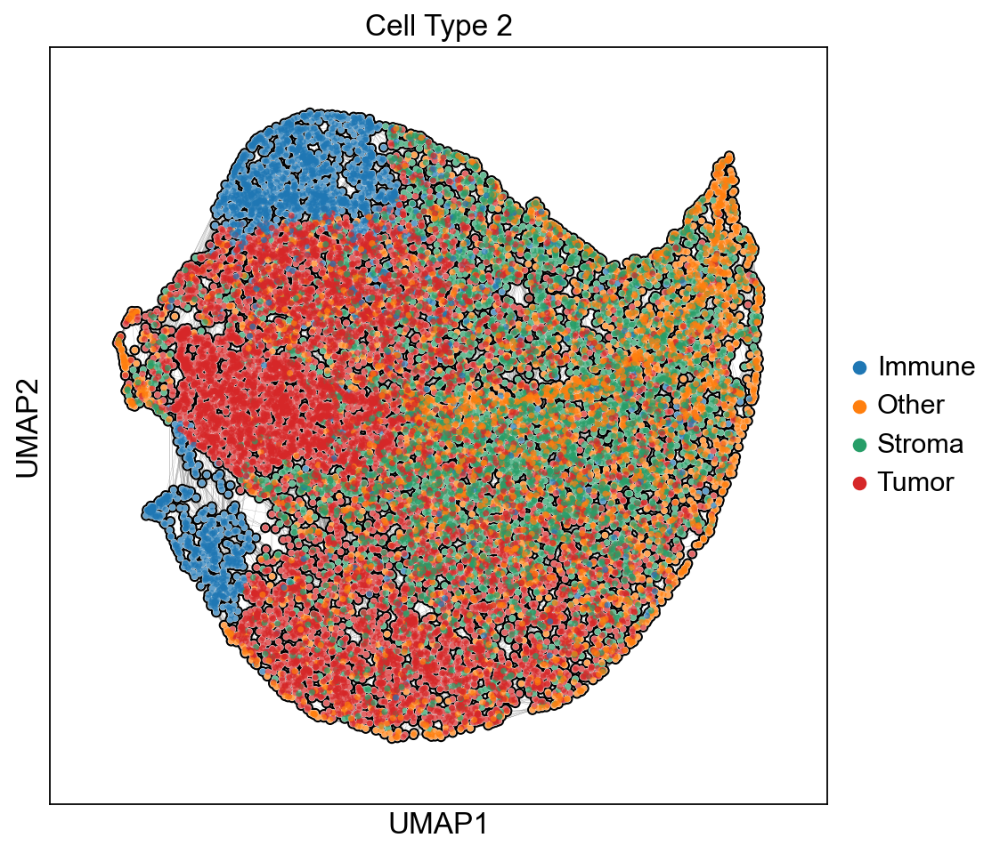

In [12]:
fig, ax = plt.subplots(figsize=(7,7))
sc.pl.umap(adata, color='Cell Type 2', ax=ax, size=40, edges=True, add_outline=True)

In [13]:
var = 'Cell Type 2'

cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

In [14]:
id = '577-1197'
adata_subset = adata[adata.obs.Condition == '577-1197']

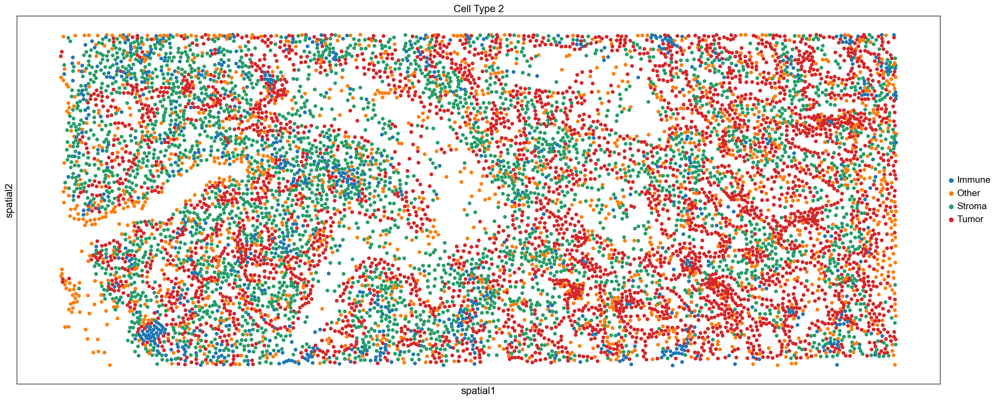

In [15]:
fig, ax = plt.subplots(figsize=(25,10))
sc.pl.spatial(adata_subset, color='Cell Type 2', spot_size=50, ax=ax)

In [16]:
adata.obs['Cell Type 2'].value_counts()

Tumor     7094
Stroma    4317
Other     3075
Immune    1749
Name: Cell Type 2, dtype: int64

# Read PPI data

In [17]:
# Read PPI
PPI_save_path =  data_dir / 'tissue' / 'PPI'

dfs = []
for path in os.listdir(PPI_save_path):
    if 'csv' in path:
        df = pd.read_csv(PPI_save_path / path)
        dfs.append(df)

df = pd.concat(dfs)

# Get nuclei and cell count
g = df.groupby(['Condition', 'FOV', 'PPI', 'Cyto']).size()
df_cell = pd.DataFrame({'Count Cyto': g}).reset_index()
df_cell = df_cell[df_cell.Cyto != 0]
df_cell.columns = ['Condition', 'FOV', 'PPI', 'Id', 'Count_cell']
df_cell = (df_cell.pivot_table(values='Count_cell', columns='PPI', index=['Condition', 'FOV','Id'])
.fillna(0)
.reset_index()
.melt(id_vars=['Condition', 'FOV','Id'], value_name='Count_cell', var_name='PPI')
)

# Combine count
df_all = df_cell

In [18]:
# Describe statistics
df_all.groupby(['Condition', 'PPI'])['Count_cell'].describe()

count      mean       std  min  25%  50%  75%   max
Condition PPI                                                                 
577-1197  Cyclin D1/CDK4  7639.0  0.076450  0.290676  0.0  0.0  0.0  0.0   4.0
          Cyclin E/CDK2   7639.0  0.008116  0.098094  0.0  0.0  0.0  0.0   3.0
          NF-Kb/p-P90rsk  7639.0  0.717371  0.992694  0.0  0.0  0.0  1.0   9.0
          Sox2/Oct4       7639.0  2.821050  2.372277  0.0  1.0  2.0  4.0  25.0
          TRAIL/DR5       7639.0  0.014662  0.124483  0.0  0.0  0.0  0.0   2.0
577-1210  Cyclin D1/CDK4  3660.0  0.282240  0.549652  0.0  0.0  0.0  0.0   6.0
          Cyclin E/CDK2   3660.0  0.007650  0.090224  0.0  0.0  0.0  0.0   2.0
          NF-Kb/p-P90rsk  3660.0  0.604098  0.946410  0.0  0.0  0.0  1.0  14.0
          Sox2/Oct4       3660.0  1.051913  1.230271  0.0  0.0  1.0  1.0  16.0
          TRAIL/DR5       3660.0  0.400000  0.789103  0.0  0.0  0.0  1.0  13.0

In [19]:
# Filter out by maximum number of counts per cell
min_count = 3
max_count = 10

df_all = df_all.groupby(['Condition', 'FOV', 'Id']).filter(lambda x: x['Count_cell'].sum() > min_count)
df_all = df_all.groupby(['Condition', 'FOV', 'Id']).filter(lambda x: (x['Count_cell'] < max_count).all())
df_all.groupby(['Condition', 'FOV', 'Id']).sum().describe()


C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\927022389.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_all.groupby(['Condition', 'FOV', 'Id']).sum().describe()


,Count_cell
count,3539.000000
mean,5.831308
std,2.045849
min,4.000000
25%,4.000000
50%,5.000000
75%,7.000000
max,21.000000


In [20]:
# Describe statistics
df_all.groupby(['Condition', 'PPI'])['Count_cell'].describe()

count      mean       std  min  25%  50%  75%  max
Condition PPI                                                                
577-1197  Cyclin D1/CDK4  2918.0  0.120288  0.365076  0.0  0.0  0.0  0.0  3.0
          Cyclin E/CDK2   2918.0  0.013365  0.123483  0.0  0.0  0.0  0.0  3.0
          NF-Kb/p-P90rsk  2918.0  1.210418  1.151053  0.0  0.0  1.0  2.0  8.0
          Sox2/Oct4       2918.0  4.521590  1.716058  0.0  3.0  4.0  6.0  9.0
          TRAIL/DR5       2918.0  0.020562  0.151290  0.0  0.0  0.0  0.0  2.0
577-1210  Cyclin D1/CDK4   621.0  0.570048  0.766436  0.0  0.0  0.0  1.0  4.0
          Cyclin E/CDK2    621.0  0.022544  0.159052  0.0  0.0  0.0  0.0  2.0
          NF-Kb/p-P90rsk   621.0  1.500805  1.325464  0.0  1.0  1.0  2.0  8.0
          Sox2/Oct4        621.0  2.476651  1.540272  0.0  1.0  2.0  3.0  9.0
          TRAIL/DR5        621.0  1.003221  1.162584  0.0  0.0  1.0  1.0  8.0

In [21]:
df_all['Condition_name'] = df_all['Condition'].apply(lambda x: {'577-1197': 'Responder', '577-1210': 'Non responder'}.get(x,x)) 

In [22]:
df_all.head()

,Condition,FOV,Id,PPI,Count_cell,Condition_name
8,577-1197,40X,36.0,Cyclin D1/CDK4,0.0,Responder
10,577-1197,40X,38.0,Cyclin D1/CDK4,0.0,Responder
11,577-1197,40X,39.0,Cyclin D1/CDK4,0.0,Responder
22,577-1197,40X,66.0,Cyclin D1/CDK4,0.0,Responder
23,577-1197,40X,67.0,Cyclin D1/CDK4,0.0,Responder


In [23]:
df_all.groupby(['Condition', 'Id'], as_index=False)['Count_cell'].sum().describe()

,Id,Count_cell
count,3539.000000,3539.000000
mean,4039.495620,5.831308
std,2641.638188,2.045849
min,4.000000,4.000000
25%,1798.500000,4.000000
50%,3868.000000,5.000000
75%,6013.000000,7.000000
max,9799.000000,21.000000


# Create cell graph and athena data

In [24]:
# Get colormap
from matplotlib.colors import ListedColormap, hex2color

# Import spatial omics library
import athena as ath
from spatialOmics import SpatialOmics

# Define cell mask dir
mask_dir =  data_dir / 'tissue' / 'masks'
mask_path = mask_dir / f'{id}_cell.png'
mask = skimage.io.imread(mask_path)

graph_folder = (Path().cwd().parents[0]).absolute() / 'tissue' / 'spatial_omics_graph'
graph_folder.mkdir(parents=True, exist_ok=True)

In [25]:
var = 'Cell Type 2'

cluster_label_order = adata.uns[f'dendrogram_{var}']['categories_ordered']

colors = adata.uns[f"{var}_colors"]
labels = adata.obs[var].cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

In [26]:
spadata = SpatialOmics()

# Get cell id
cell_id = np.unique(mask)

# Get obs
obs = adata_subset.obs.copy()
obs.index = obs.Cell.tolist()
obs.index = obs.Cell.tolist()
obs['x'] = adata_subset.obsm['spatial'][:,0]
obs['y'] = adata_subset.obsm['spatial'][:,1]

# Get obs
spadata.obs[id] = obs
spadata.X[id] = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names.tolist(), index=obs.Cell.tolist())
spadata.var[id] = adata_subset.var
spadata.masks[id] = {'cellmasks': mask}
ath.pp.extract_centroids(spadata, id, mask_key='cellmasks')

In [27]:
# import default graph builder parameters
from athena.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS

# radius graph
config = GRAPH_BUILDER_DEFAULT_PARAMS['radius']
config['builder_params']['radius'] = 100 # set radius
ath.graph.build_graph(spadata, id, builder_type='radius', mask_key='cellmasks', config=config)

In [28]:
spadata.obs[id]['cell_type_id'] = spadata.obs[id].groupby('Cell Type 2').ngroup().astype('category')
labs = spadata.obs[id].groupby(['cell_type_id']).head(1)[['cell_type_id', 'Cell Type 2']].set_index('cell_type_id').to_dict()

cmap = ListedColormap([hex2color(i) for i in adata_subset.uns['Cell Type 2_colors']])
spadata.uns['cmaps'].update({'cell_type_id':cmap})
spadata.uns['cmap_labels'].update({'cell_type_id': labs['Cell Type 2']})


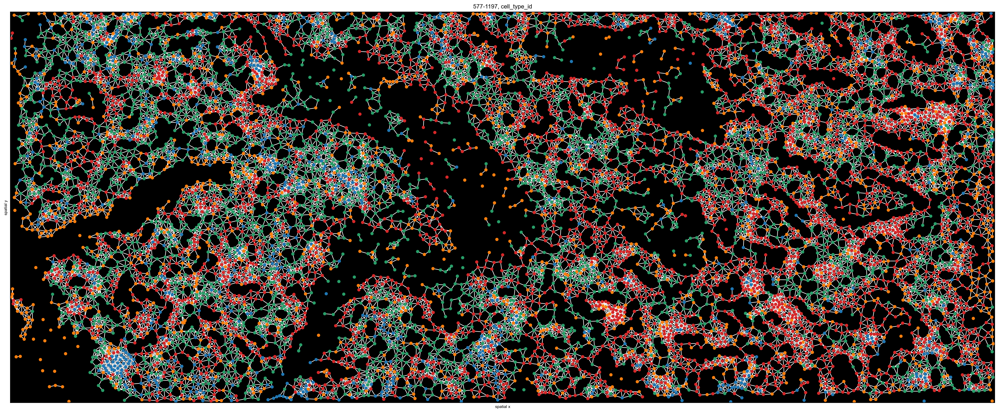

In [29]:
fig, ax = plt.subplots(figsize=(25,10))
ath.pl.spatial(spadata, id,'cell_type_id', edges=True, graph_key='radius', ax=ax, cbar=False, node_size=20, background_color='k', edge_color='w', edge_width=1)
ax.invert_yaxis()

In [30]:
# Define matching bbox to figures
x_min, y_min = 1744, 2100
x_max, y_max = 3529, 3524


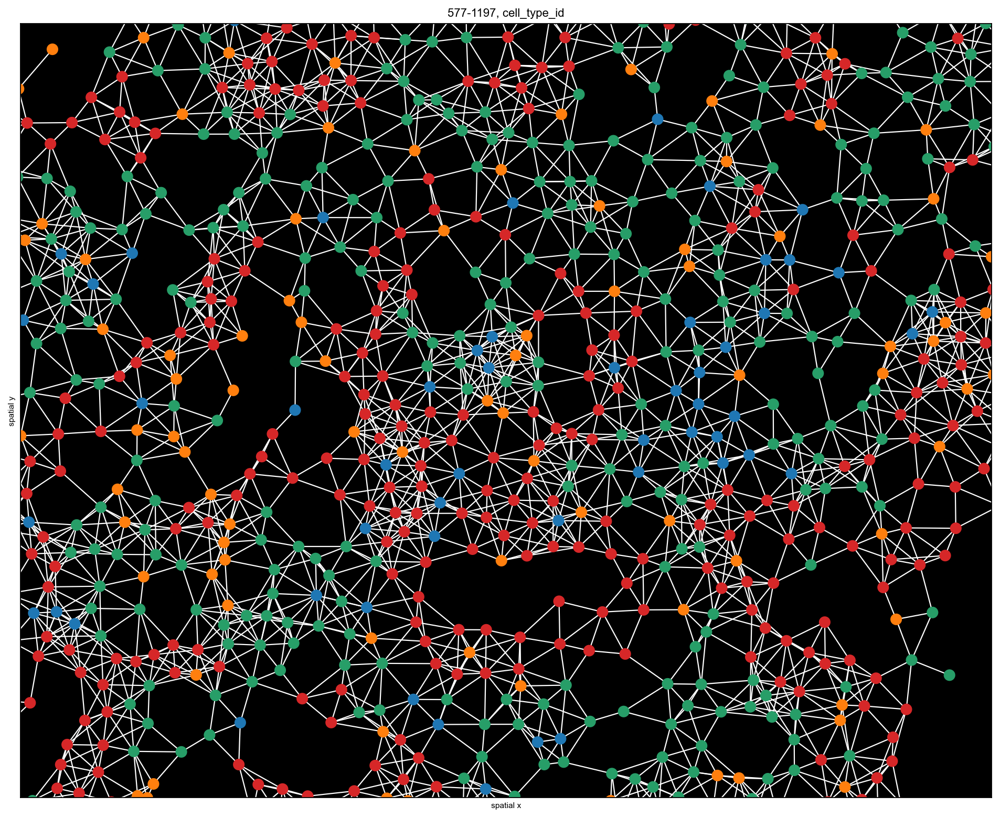

In [31]:
fig, ax = plt.subplots(figsize=(25,10))
ath.pl.spatial(spadata, id,'cell_type_id', edges=True, graph_key='radius', ax=ax, cbar=False, node_size=80, background_color='k', edge_color='w', edge_width=1)
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.invert_yaxis()

## Extract count of tumor cell neighbor

In [32]:
import networkx as nx 

In [33]:
# Get cell id to cell type mapping
cell_type_dict = dict(zip(adata_subset.obs['Cell'].tolist(), adata_subset.obs['Cell Type 2'].tolist()))

# Get generated networkx graphs
G = spadata.G[id]['radius']
G.remove_edges_from(nx.selfloop_edges(G))

# Get list of neighbors
neighbors_dict = nx.to_dict_of_lists(G)

# Count number of neigbors type per cell
neighbors_type_dict = {}
types = ['Stroma', 'Tumor', 'Immune']
neighbors_count_dict = {}
for cell in cell_type_dict.keys():
    neighbors = neighbors_dict[cell]
    neighbors_type = [cell_type_dict[i] for i in neighbors]
    neighbors_type_dict[cell] = neighbors_type
    neighbors_count_dict[cell] = {'Stroma': np.equal(np.array(neighbors_type).astype(str), 'Stroma').sum(),
                                  'Tumor': np.equal(np.array(neighbors_type).astype(str), 'Tumor').sum(),
                                  'Immune': np.equal(np.array(neighbors_type).astype(str), 'Immune').sum()}

In [34]:
df_obs = adata.obs.copy()

# Merge PPI count dataframe with Cell type adata
df_all['Id'] = df_all['Id'].astype(int)
df_all_combined = df_all.merge(df_obs, left_on=['Condition', 'Id'], right_on=['Condition', 'Cell'], how='left')

# Rename to class
map_dict = {'PanCK+': 'Tumor', 'Stroma': 'Stroma', 'CD4+':'Immune', 'Epithelial':'Tumor', 'CD8+':'Immune'}
df_all_combined['Class'] = df_all_combined['Cell Type'].apply(lambda x: map_dict.get(x,x))
df_40x = df_all_combined[df_all_combined.Condition == '577-1197']

df_count_neigbors = pd.DataFrame.from_dict(neighbors_count_dict, orient='index').reset_index(names=['Cell'])
df_count_neigbors.head()

,Cell,Stroma,Tumor,Immune
0,1,1,1,1
1,2,1,0,1
2,3,1,1,2
3,4,1,1,2
4,5,0,3,0


In [35]:
df_all_combined['Cell Type 2'].value_counts()

Tumor     9880
Stroma    4800
Other     1660
Immune    1355
Name: Cell Type 2, dtype: int64

In [36]:
df_40x['Cell Type 2'].value_counts()

Tumor     8070
Stroma    4420
Other     1160
Immune     940
Name: Cell Type 2, dtype: int64

In [37]:
df_merged = df_40x.merge(df_count_neigbors, left_on=['Id'], right_on=['Cell'], how='left')

In [38]:
df_merged['Cell Type 2'].value_counts()

Tumor     8070
Stroma    4420
Other     1160
Immune     940
Name: Cell Type 2, dtype: int64

In [39]:
df_merged['Class'].value_counts()

Tumor     8070
Stroma    4420
Other     1160
Immune     940
Name: Class, dtype: int64

## Stat plot

In [40]:
from statannotations.Annotator import Annotator

sns.set_style('white')
def plot(plotting, figsize=(15,10), y_title='Count PPI per cell'):
    c1, c2 = plotting['data'][plotting['hue']].unique()
    pairs = [((e, c1), (e, c2)) for e in plotting['data'][plotting['x']].unique()]

    with sns.plotting_context('talk', font_scale=2):
        fig, ax = plt.subplots(figsize=figsize)
        ax = sns.violinplot(**plotting, showfliers=False, ax=ax,  bw=1, cut=0)
        # ax = sns.boxplot(**plotting, showfliers=False, ax=ax)
        # ax = sns.swarmplot(**plotting, ax=ax, dodge=True)
        annot = Annotator(ax, pairs, **plotting)
        annot.configure(test='t-test_ind', comparisons_correction = 'Bonferroni', text_format='star', loc='outside', verbose=2)
        result = annot.apply_test().annotate()
        ax.set_ylabel(y_title, fontsize=70)
        plt.xticks(rotation=30, ha='right')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)


C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\1875930138.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Immune Neighbors'] = 'No Immune neighbors'


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cyclin E/CDK2_No Immune neighbors vs. Cyclin E/CDK2_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.487e-01
Cyclin D1/CDK4_No Immune neighbors vs. Cyclin D1/CDK4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.024e-01
NF-Kb/p-P90rsk_No Immune neighbors vs. NF-Kb/p-P90rsk_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:2.012e-01 t=2.053e+00
Sox2/Oct4_No Immune neighbors vs. Sox2/Oct4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:2.292e-02 t=2.839e+00
TRAIL/DR5_No Immune neighbors vs. TRAIL/DR5_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=1.326e-01


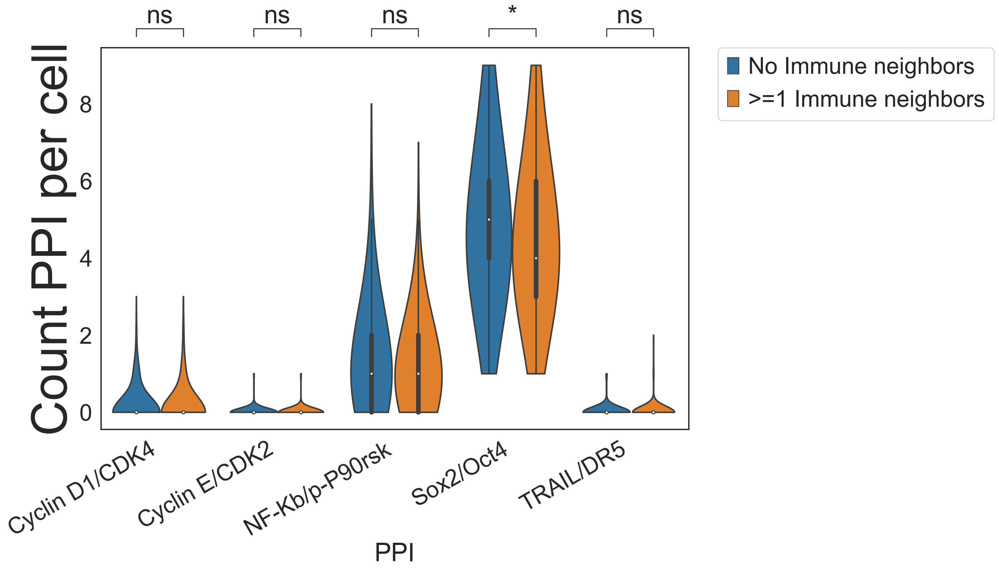

In [41]:
df_subset = df_merged[df_merged['Class'] == 'Tumor']
df_subset['Immune Neighbors'] = 'No Immune neighbors'
df_subset.loc[df_subset.Immune > 0, 'Immune Neighbors'] = '>=1 Immune neighbors'

# Boxplot per cell
plotting = {
    "data": df_subset,
    "x": "PPI", 
    "y": "Count_cell",
    "hue": "Immune Neighbors",
    "hue_order": ['No Immune neighbors', ">=1 Immune neighbors", ]
}

plot(plotting)

In [46]:
df_subset.groupby([plotting['hue'], plotting['x']])[plotting['y']].describe().to_clipboard()

C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\1491243380.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Immune Neighbors'] = 'No Immune neighbors'


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cyclin E/CDK2_No Immune neighbors vs. Cyclin E/CDK2_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.948e-01
Cyclin D1/CDK4_No Immune neighbors vs. Cyclin D1/CDK4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:5.991e-01 t=-1.557e+00
NF-Kb/p-P90rsk_No Immune neighbors vs. NF-Kb/p-P90rsk_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=3.844e-01
Sox2/Oct4_No Immune neighbors vs. Sox2/Oct4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=7.140e-01
TRAIL/DR5_No Immune neighbors vs. TRAIL/DR5_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.240e+00


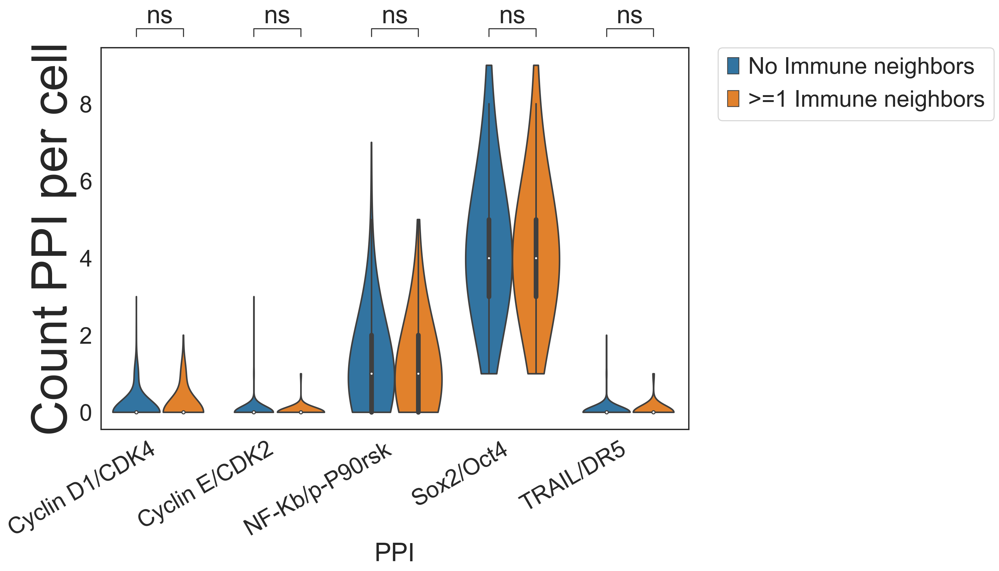

In [47]:
df_subset = df_merged[df_merged['Class'] == 'Stroma']
df_subset['Immune Neighbors'] = 'No Immune neighbors'
df_subset.loc[df_subset.Immune > 0, 'Immune Neighbors'] = '>=1 Immune neighbors'

# Boxplot per cell
plotting = {
    "data": df_subset,
    "x": "PPI", 
    "y": "Count_cell",
    "hue": "Immune Neighbors",
    "hue_order": ['No Immune neighbors', ">=1 Immune neighbors", ]
}

plot(plotting)

In [48]:
df_subset.groupby([plotting['hue'], plotting['x']])[plotting['y']].describe().to_clipboard()

C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\851365112.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Immune Neighbors'] = 'No Immune neighbors'


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cyclin E/CDK2_No Immune neighbors vs. Cyclin E/CDK2_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=6.658e-01
Cyclin D1/CDK4_No Immune neighbors vs. Cyclin D1/CDK4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.231e+00
NF-Kb/p-P90rsk_No Immune neighbors vs. NF-Kb/p-P90rsk_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.740e-01
Sox2/Oct4_No Immune neighbors vs. Sox2/Oct4_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=8.767e-01
TRAIL/DR5_No Immune neighbors vs. TRAIL/DR5_>=1 Immune neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=9.478e-01


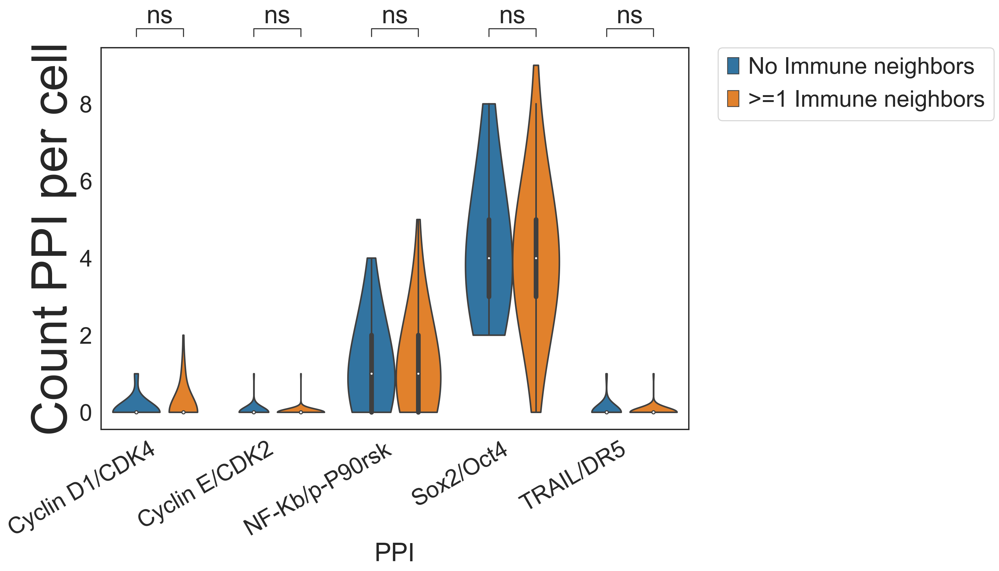

In [49]:
df_subset = df_merged[df_merged['Class'] == 'Immune']
df_subset['Immune Neighbors'] = 'No Immune neighbors'
df_subset.loc[df_subset.Immune > 0, 'Immune Neighbors'] = '>=1 Immune neighbors'

# Boxplot per cell
plotting = {
    "data": df_subset,
    "x": "PPI", 
    "y": "Count_cell",
    "hue": "Immune Neighbors",
    "hue_order": ['No Immune neighbors', ">=1 Immune neighbors", ]
}

plot(plotting)

In [51]:
df_subset.groupby([plotting['hue'], plotting['x']])[plotting['y']].describe().to_clipboard()

C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\3537402257.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Tumor Neighbors'] = 'No Tumor neighbors'


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cyclin E/CDK2_No Tumor neighbors vs. Cyclin E/CDK2_>=1 Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=6.863e-01
Cyclin D1/CDK4_No Tumor neighbors vs. Cyclin D1/CDK4_>=1 Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=9.969e-02
NF-Kb/p-P90rsk_No Tumor neighbors vs. NF-Kb/p-P90rsk_>=1 Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-7.386e-01
Sox2/Oct4_No Tumor neighbors vs. Sox2/Oct4_>=1 Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-1.208e+00
TRAIL/DR5_No Tumor neighbors vs. TRAIL/DR5_>=1 Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=9.772e-01


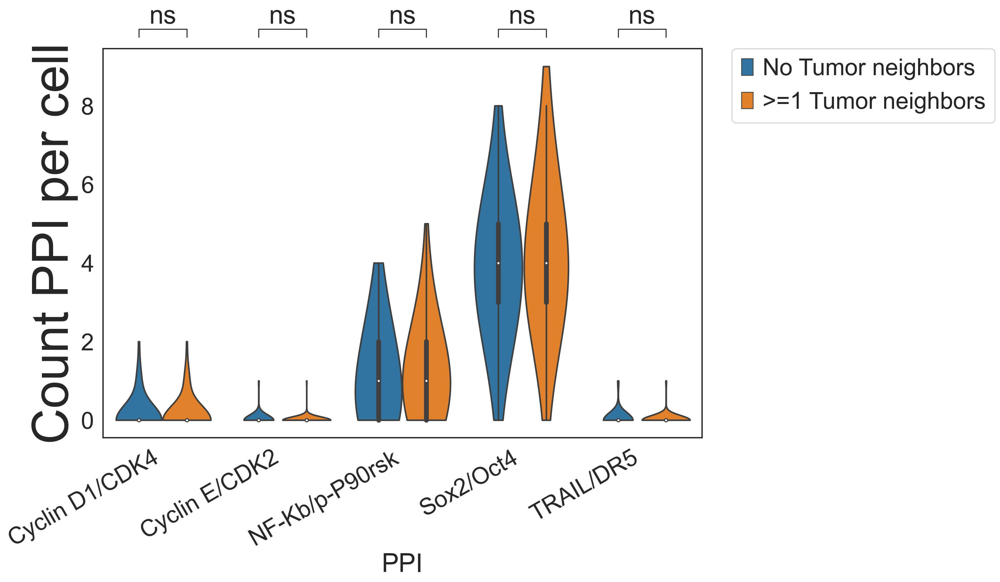

In [52]:
df_subset = df_merged[df_merged['Class'] == 'Immune']
df_subset['Tumor Neighbors'] = 'No Tumor neighbors'
df_subset.loc[df_subset.Tumor > 0, 'Tumor Neighbors'] = '>=1 Tumor neighbors'

# Boxplot per cell
plotting = {
    "data": df_subset,
    "x": "PPI", 
    "y": "Count_cell",
    "hue": "Tumor Neighbors",
    "hue_order": ['No Tumor neighbors', ">=1 Tumor neighbors", ]
}

plot(plotting)

C:\Users\thu71\AppData\Local\Temp\ipykernel_1080816\105752285.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['Tumor Neighbors'] = 'Low Tumor neighbors'


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Cyclin E/CDK2_Low Tumor neighbors vs. Cyclin E/CDK2_High Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-4.702e-01
Cyclin D1/CDK4_Low Tumor neighbors vs. Cyclin D1/CDK4_High Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-6.079e-01
NF-Kb/p-P90rsk_Low Tumor neighbors vs. NF-Kb/p-P90rsk_High Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:3.117e-03 t=3.428e+00
Sox2/Oct4_Low Tumor neighbors vs. Sox2/Oct4_High Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.156e-02 t=3.052e+00
TRAIL/DR5_Low Tumor neighbors vs. TRAIL/DR5_High Tumor neighbors: t-test independent samples with Bonferroni correction, P_val:1.000e+00 t=-6.575e-02


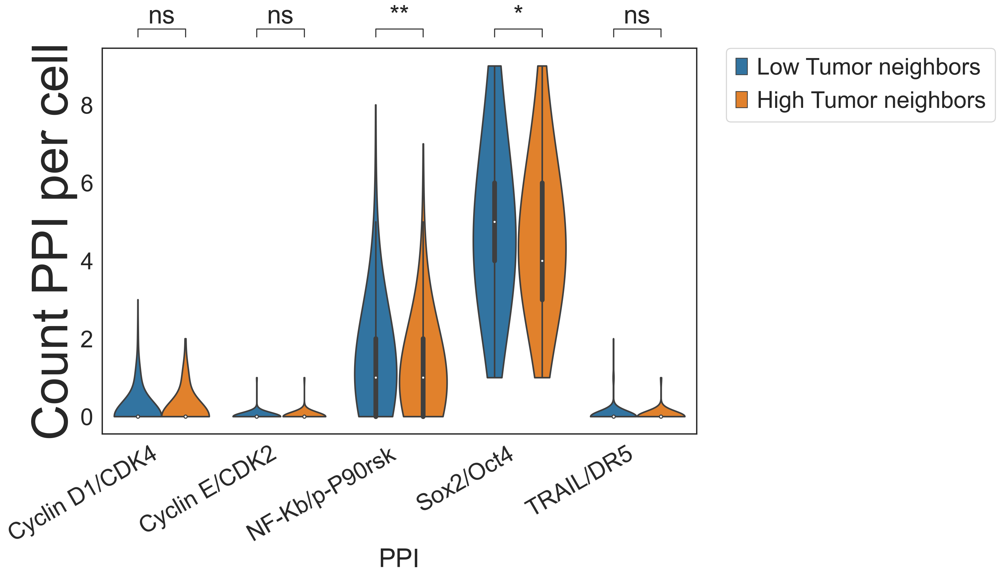

In [53]:
df_subset = df_merged[df_merged['Class'] == 'Tumor']
df_subset['Tumor Neighbors'] = 'Low Tumor neighbors'
df_subset.loc[df_subset.Tumor > 4, 'Tumor Neighbors'] = 'High Tumor neighbors'

# Boxplot per cell
plotting = {
    "data": df_subset,
    "x": "PPI", 
    "y": "Count_cell",
    "hue": "Tumor Neighbors"
}

plot(plotting)

In [54]:
df_subset.groupby([plotting['hue'], plotting['x']])[plotting['y']].describe().to_clipboard()